<a href="https://colab.research.google.com/github/kaylacroiger/Probability-and-Statistics/blob/main/Kayla_Croiger_Lab_7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Classification Data

Pine Trees Versus Palm Trees

In [13]:
%%capture
!pip install wandb
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests
from pdf2image import convert_from_path
import matplotlib.pyplot as plt
import numpy as np
import torch
import requests
from torchvision import *
from torchvision.models import *
import wandb as wb
#importing all libraries
#importing images and image classification

In [14]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
#using the first GPU first, if that does not work then uses the CPU

def GPU(data):
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device)
#graidents compouted for this tensor, true value

def GPU_data(data):
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=device)
#graidents dectected for this sensor, false value

def plot(x):
    fig, ax = plt.subplots()
    im = ax.imshow(x, cmap = 'gray')
    ax.axis('off')
    fig.set_size_inches(5, 5)
    plt.show()
#plots the image x in greyscale
#axses turned off

def get_google_slide(url):
    url_head = "https://docs.google.com/presentation/d/"
    url_body = url.split('/')[5]
    page_id = url.split('.')[-1]
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id
#importing the google slides presentation

def get_slides(url):
    url = get_google_slide(url)
    r = requests.get(url, allow_redirects=True)
    open('file.pdf', 'wb').write(r.content)
    images = convert_from_path('file.pdf', 500)
    return images
#opening file and retrieving data
def load(image, size=224):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]
    transform = transforms.Compose([
        transforms.Resize(size),
        transforms.CenterCrop(size),
        transforms.ToTensor(),
        transforms.Normalize(means, stds)
    ])
    #defining image sizes

    tensor = transform(image).unsqueeze(0).to(device)
    tensor.requires_grad = True
    return tensor
    #transforming the data into a tensor



In [15]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}

model = alexnet(weights='DEFAULT').to(device)
model.eval();

In [16]:
url = "https://docs.google.com/presentation/d/1jMmCJDnr3Noc9149jUXLRW6REg8H0zaNmYsi6Nw_QTg/edit#slide=id.g19b8867b70f_0_176"

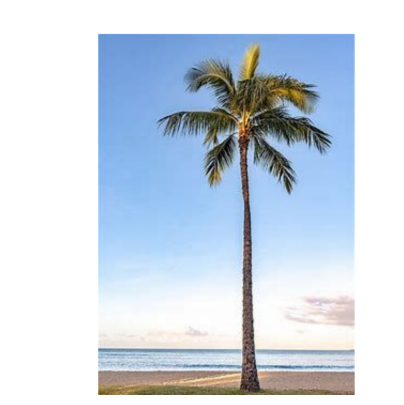

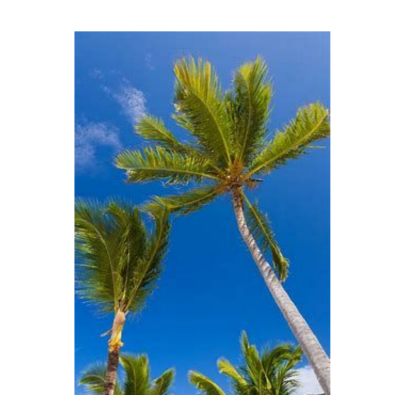

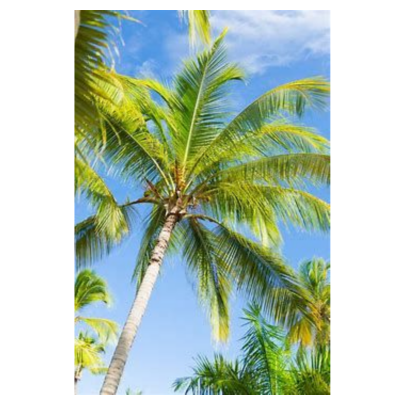

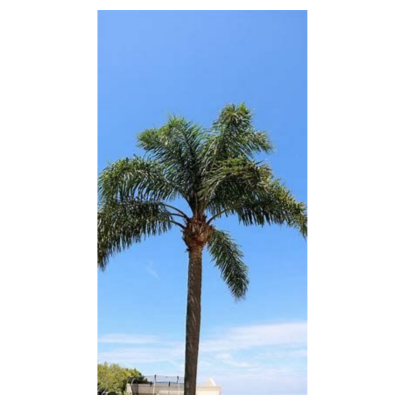

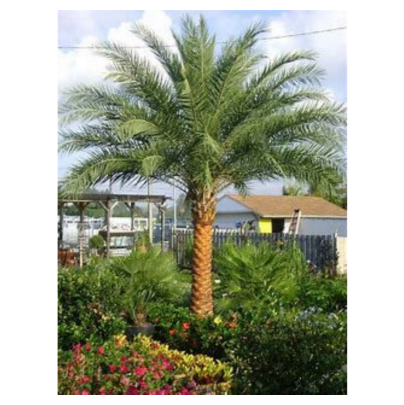

...

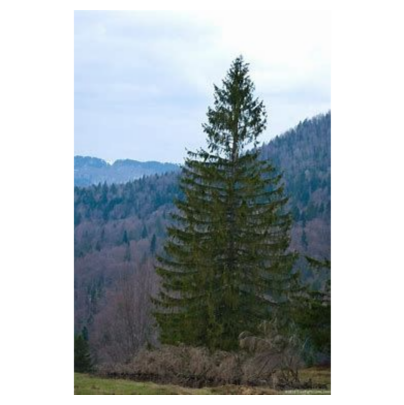

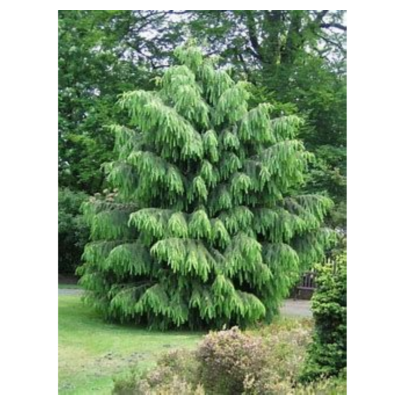

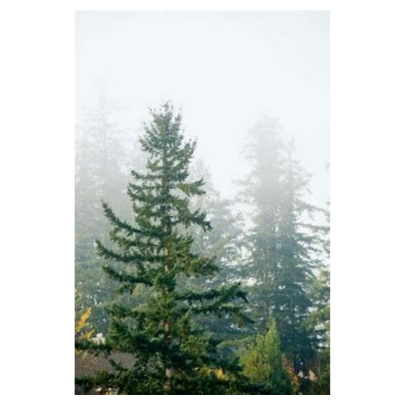

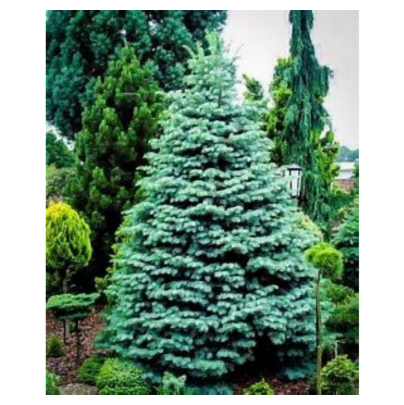

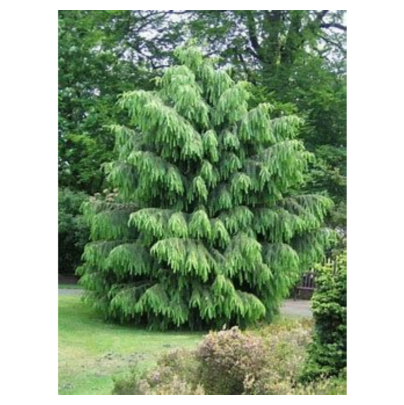

In [17]:
images = []

for image in get_slides(url):

    plot(image)

    images.append(load(image))

images = torch.vstack(images)

#inserted 25 pictures of palm trees and 25 pictures of pine trees

In [18]:
images.shape

torch.Size([50, 3, 224, 224])

In [19]:
model(images)

tensor([[-4.6310,  0.7358, -2.8279,  ..., -4.0393,  0.7520,  2.3489],
        [-1.1484,  1.0157, -2.5991,  ..., -2.5515,  7.1970, -0.4337],
        [ 0.9371,  2.0665, -2.8998,  ..., -3.2953,  8.0482,  1.0551],
        ...,
        [ 2.3448, -0.3423, -2.2862,  ..., -3.8818,  2.3774,  1.9542],
        [ 0.0480, -1.9598, -2.5678,  ..., -3.0224,  2.2863,  0.4534],
        [ 2.1100, -1.7314, -2.8364,  ..., -0.8381,  2.6588, -0.0561]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

#AI guesses what each image is a picture of

In [20]:
y = model(images)

In [21]:
y.shape

torch.Size([50, 1000])

In [22]:
guesses = torch.argmax(y, 1).cpu().numpy()

In [23]:
for i in list(guesses):
    print(labels[i])
    #the guesses that are made when there are endless possissibilites given to the ai model.

pole
safety pin
corn
obelisk
pineapple, ananas
window shade
shoji
flagpole, flagstaff
flagpole, flagstaff
pineapple, ananas
buckeye, horse chestnut, conker
flagpole, flagstaff
safety pin
zebra
broom
vase
indigo bunting, indigo finch, indigo bird, Passerina cyanea
buckeye, horse chestnut, conker
dragonfly, darning needle, devil's darning needle, sewing needle, snake feeder, snake doctor, mosquito hawk, skeeter hawk
buckeye, horse chestnut, conker
quill, quill pen
quill, quill pen
ear, spike, capitulum
black and gold garden spider, Argiope aurantia
buckeye, horse chestnut, conker
obelisk
obelisk
obelisk
maze, labyrinth
broccoli
obelisk
flagpole, flagstaff
shoji
obelisk
obelisk
thatch, thatched roof
stone wall
stone wall
head cabbage
barn
mobile home, manufactured home
obelisk
barn
obelisk
castle
obelisk
head cabbage
obelisk
obelisk
head cabbage


In [1]:
Y

NameError: name 'Y' is not defined

In [ ]:
# Y = np.zeros(100,)
# Y[50:] = 1
#array with 50 numbers from 0-1, the first 25 will be the 0 values, representing the first set of pictures  {palm trees}
#the next 25 will be the 1 values, representign the second set of pictures (pine trees)

In [ ]:
Y

In [ ]:
X = y.detach().cpu().numpy()
#converting pytorch value y to x

In [ ]:
X.shape
#creating the graph

In [ ]:
plt.plot(X[0],'.')

In [ ]:
plt.hist(X[0])
#plotting the data as a histogram

In [ ]:
X = GPU_data(X)
Y = GPU_data(Y)

#Creating a Machine Learning Model

In [ ]:
def softmax(x):
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [ ]:
def cross_entropy(outputs, labels):
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [ ]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0
    sigma = 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma)
    return R.rvs(s)
    #generates random numbers based on a set normal distribution curve

In [ ]:
def Truncated_Normal(size):

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z
    #defing the perameters for the normal distribution

In [ ]:
def acc(out,y):
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]
        #shape of the graph's curve

In [ ]:
X.shape

In [ ]:
def get_batch(mode):
    b = c.b
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w):

    return x@w[0]

In [ ]:
def make_plots():

    acc_train = acc(model(x,w),y)

    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train})

In [ ]:
wb.init(project="Linear_Model_Photo_1");
c = wb.config
#creates a visual tracking model in order to classifiy different images
#logs all image data for clasification

c.h = 0.001
c.b = 32
c.epochs = 100000
#perameters for the configuration

w = [GPU(Truncated_Normal((1000,2)))]
#1000 inputs with 2 possible outputs

optimizer = torch.optim.Adam(w, lr=c.h)
#training for machine learning models

for i in range(c.epochs):

    x,y = get_batch('train')

    loss = cross_entropy(softmax(model(x,w)),y)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
#sets up otimization learning tools to plot the graph
    wb.log({"loss": loss})

    make_plots()
#plots graph of how the images are being classified.